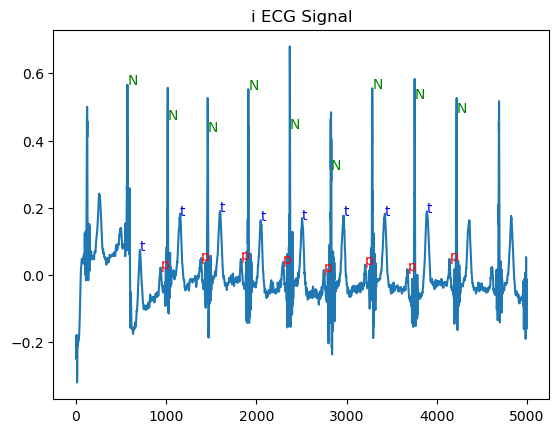

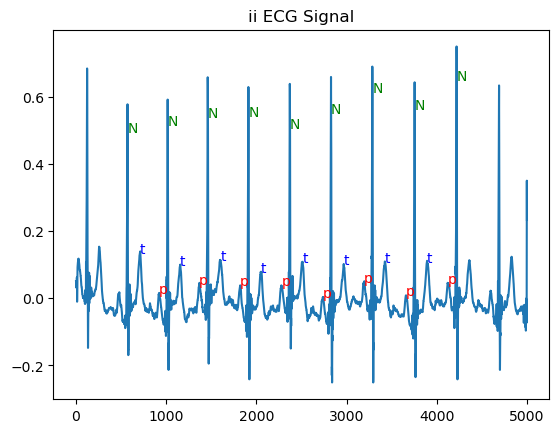

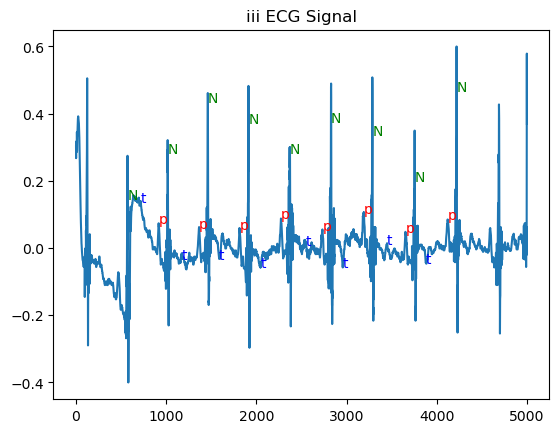

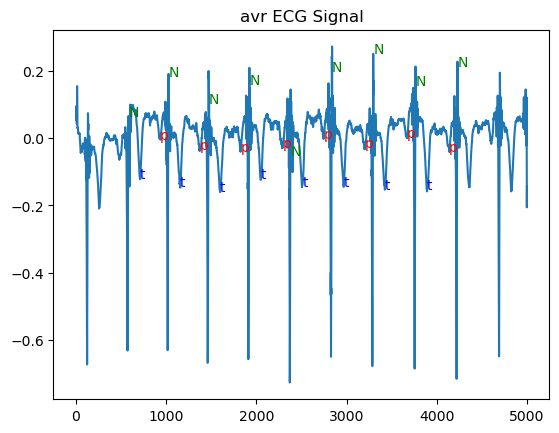

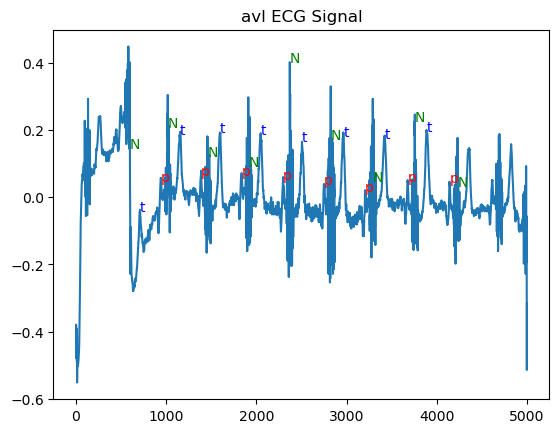

...

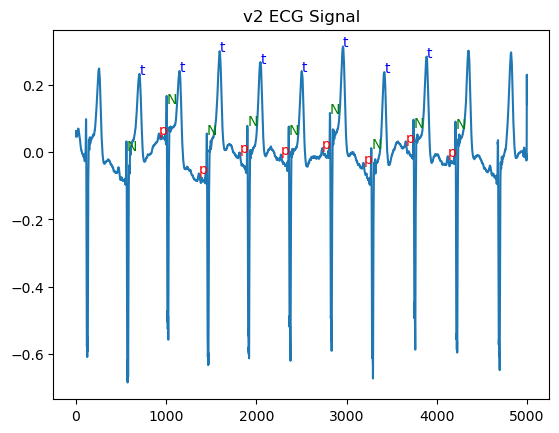

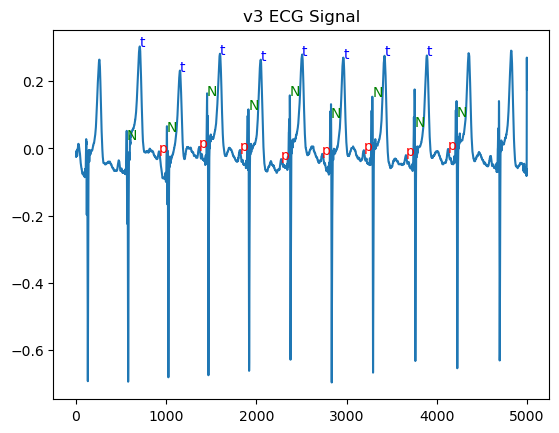

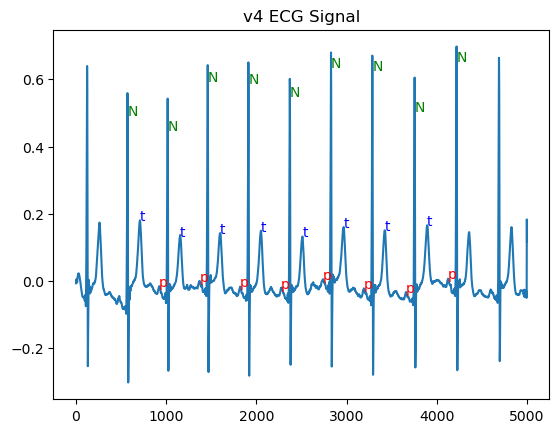

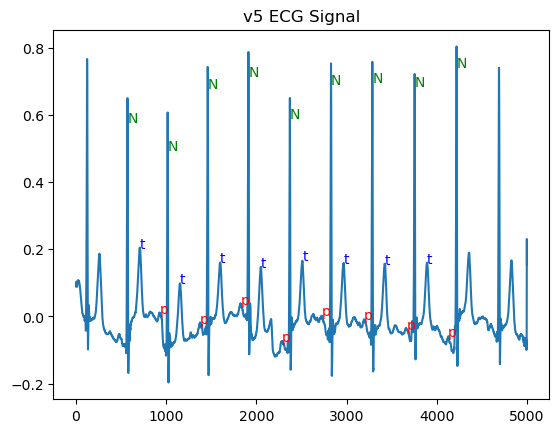

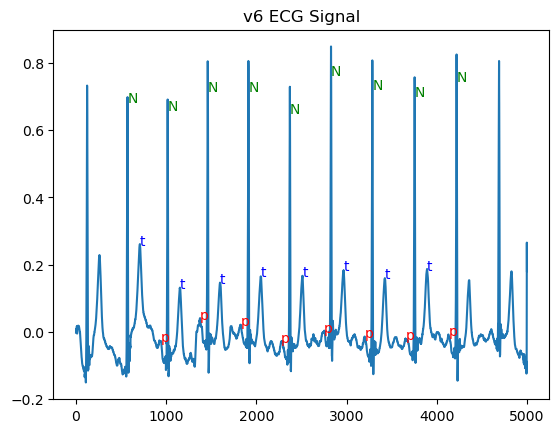

In [6]:
import wfdb
import matplotlib.pyplot as plt

# Replace '2' with the base file name of your ECG data
record = wfdb.rdrecord('data/2')

# Read annotations for each lead and plot them
for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
    # Read signal and annotations
    sig, fields = wfdb.rdsamp('data/2', channels=[record.sig_name.index(lead_extension[1:])])
    annotation = wfdb.rdann('data/2', extension=lead_extension[1:])  # Remove the dot from the extension
    
    # Plot ECG signal
    plt.figure()
    plt.plot(sig)
    plt.title(f'{lead_extension[1:]} ECG Signal')
    
    # Plot annotations
    for i, symbol in enumerate(annotation.symbol):
        if symbol in ['p', 'P', 'N', 't', 'T']:  # Only plot peaks of interest
            plt.text(annotation.sample[i], sig[annotation.sample[i]], symbol, color='r' if symbol in ['p', 'P'] else 'g' if symbol == 'N' else 'b')
    
    plt.show()


In [16]:
import os
import numpy as np
import wfdb

window_size = 100

# Create a folder to save segmented data if it doesn't exist
if not os.path.exists('data_segmented'):
    os.makedirs('data_segmented')

# Load the ECG record
for k in range(3):
    record_num = f'{k+1}'
    record_path = os.path.join('data', record_num)
    record = wfdb.rdrecord(record_path)
    # Iterate over each lead
    for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
        # Load annotations for the current lead
        annotation = wfdb.rdann(record_path, extension=lead_extension[1:])

        # Extract the ECG signal for the current lead
        lead_index = record.sig_name.index(lead_extension[1:])
        ecg_signal = record.p_signal[:, lead_index]

        # Find the indices where 'p' and 't' occur
        p_indices = [i for i, symbol in enumerate(annotation.symbol) if symbol in ['p', 'P']]
        t_indices = [i for i, symbol in enumerate(annotation.symbol) if symbol in ['t', 'T']]

        # Iterate over each 'p' and find the corresponding 't'
        for p_idx in p_indices:
            # Find the next 't' index after 'p'
            t_idx = next((idx for idx in t_indices if idx > p_idx), None)
            if t_idx is not None:
                start = max(0, annotation.sample[p_idx] - window_size)
                end = min(len(ecg_signal), annotation.sample[t_idx] + window_size)
                segment = ecg_signal[start:end]

                # Determine beat type based on annotation
                beat_type = 'N' if 'N' in annotation.symbol[p_idx:t_idx+1] else 'A'

                # Save the segment as a new file in the data_segmented folder
                i = p_indices.index(p_idx)  # Get index of current 'p'
                file_name = f"data_segmented/{record_num}_{lead_extension[1:]}_segment_{i}_{beat_type}.csv"
                np.savetxt(file_name, segment, delimiter=",")
                print(f"Segment {i} ({beat_type}) for {lead_extension[1:]} saved as {file_name}")


Segment 0 (N) for i saved as data_segmented/1_i_segment_0_N.csv
Segment 1 (N) for i saved as data_segmented/1_i_segment_1_N.csv
Segment 2 (N) for i saved as data_segmented/1_i_segment_2_N.csv
Segment 3 (N) for i saved as data_segmented/1_i_segment_3_N.csv
Segment 0 (N) for ii saved as data_segmented/1_ii_segment_0_N.csv
Segment 1 (N) for ii saved as data_segmented/1_ii_segment_1_N.csv
Segment 2 (N) for ii saved as data_segmented/1_ii_segment_2_N.csv
Segment 3 (N) for ii saved as data_segmented/1_ii_segment_3_N.csv
Segment 0 (N) for iii saved as data_segmented/1_iii_segment_0_N.csv
Segment 1 (N) for iii saved as data_segmented/1_iii_segment_1_N.csv
Segment 2 (N) for iii saved as data_segmented/1_iii_segment_2_N.csv
Segment 3 (N) for iii saved as data_segmented/1_iii_segment_3_N.csv
Segment 0 (N) for avr saved as data_segmented/1_avr_segment_0_N.csv
Segment 1 (N) for avr saved as data_segmented/1_avr_segment_1_N.csv
Segment 2 (N) for avr saved as data_segmented/1_avr_segment_2_N.csv
Segm

# Criando segmentos

In [19]:
import os
import numpy as np
from scipy.signal import find_peaks
import wfdb

# Create a folder to save segmented data if it doesn't exist
if not os.path.exists('data_segmented'):
    os.makedirs('data_segmented')

# Load the ECG record
for k in range(3):
    record_num = f'{k+1}'
    record_path = os.path.join('data', record_num)
    record = wfdb.rdrecord(record_path)

    # Extract the ECG signal
    ecg_signal = record.p_signal[:, 0]  # Assuming single lead, adjust if necessary

    # Find QRS complex peaks
    peaks, _ = find_peaks(ecg_signal, height=0.5)  # Adjust height threshold as needed

    # Define a window size around each QRS complex
    window_size = 100  # Adjust as needed

    # Extract segments around each QRS complex
    for i, peak in enumerate(peaks):
        start = max(0, peak - window_size)
        end = min(len(ecg_signal), peak + window_size)
        segment = ecg_signal[start:end]

        # Save the segment as a new file in the data_segmented folder
        file_name = f"data_segmented/{record_num}_segment_{i}.csv"  # Adjust file name as needed
        np.savetxt(file_name, segment, delimiter=",")
        print(f"Segment {i} saved as {file_name}")

Segment 0 saved as data_segmented/1_segment_0.csv
Segment 1 saved as data_segmented/1_segment_1.csv
Segment 2 saved as data_segmented/1_segment_2.csv
Segment 3 saved as data_segmented/1_segment_3.csv
Segment 4 saved as data_segmented/1_segment_4.csv
Segment 5 saved as data_segmented/1_segment_5.csv
Segment 6 saved as data_segmented/1_segment_6.csv
Segment 7 saved as data_segmented/1_segment_7.csv
Segment 8 saved as data_segmented/1_segment_8.csv
Segment 9 saved as data_segmented/1_segment_9.csv
Segment 10 saved as data_segmented/1_segment_10.csv
Segment 0 saved as data_segmented/2_segment_0.csv
Segment 1 saved as data_segmented/2_segment_1.csv
Segment 2 saved as data_segmented/2_segment_2.csv
Segment 3 saved as data_segmented/2_segment_3.csv
Segment 4 saved as data_segmented/2_segment_4.csv
Segment 5 saved as data_segmented/2_segment_5.csv
Segment 6 saved as data_segmented/2_segment_6.csv
Segment 7 saved as data_segmented/2_segment_7.csv
Segment 8 saved as data_segmented/2_segment_8.cs

In [6]:
import os
import numpy as np
import wfdb

window_size = 100

# Create a folder to save segmented data if it doesn't exist
if not os.path.exists('data_segmented'):
    os.makedirs('data_segmented')

# Load the ECG record
for k in range(3):
    record_num = f'{k+1}'
    record_path = os.path.join('data', record_num)
    record = wfdb.rdrecord(record_path)
    # Iterate over each lead
    for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
        # Load annotations for the current lead
        annotation = wfdb.rdann(record_path, extension=lead_extension[1:])

        # Extract the ECG signal for the current lead
        lead_index = record.sig_name.index(lead_extension[1:])
        ecg_signal = record.p_signal[:, lead_index]

        # Iterate over each heartbeat and segment it
        for i, (peak, beat_type) in enumerate(zip(annotation.sample, annotation.symbol)):
            start = max(0, peak - window_size)
            end = min(len(ecg_signal), peak + window_size)
            segment = ecg_signal[start:end]

            # Check beat type and replace with 'A' if not 'N'
            if beat_type not in ['N', 'p', 'P', 't', 'T']:
                beat_type = 'A'

            # Save the segment as a new file in the data_segmented folder
            file_name = f"data_segmented/{record_num}_{lead_extension[1:]}_segment_{i}_{beat_type}.csv"
            np.savetxt(file_name, segment, delimiter=",")
            print(f"Segment {i} ({beat_type}) for {lead_extension[1:]} saved as {file_name}")


Segment 0 (A) for i saved as data_segmented/1_i_segment_0_A.csv
Segment 1 (N) for i saved as data_segmented/1_i_segment_1_N.csv
Segment 2 (A) for i saved as data_segmented/1_i_segment_2_A.csv
Segment 3 (A) for i saved as data_segmented/1_i_segment_3_A.csv
Segment 4 (t) for i saved as data_segmented/1_i_segment_4_t.csv
Segment 5 (A) for i saved as data_segmented/1_i_segment_5_A.csv
Segment 6 (A) for i saved as data_segmented/1_i_segment_6_A.csv
Segment 7 (p) for i saved as data_segmented/1_i_segment_7_p.csv
Segment 8 (A) for i saved as data_segmented/1_i_segment_8_A.csv
Segment 9 (A) for i saved as data_segmented/1_i_segment_9_A.csv
Segment 10 (N) for i saved as data_segmented/1_i_segment_10_N.csv
Segment 11 (A) for i saved as data_segmented/1_i_segment_11_A.csv
Segment 12 (A) for i saved as data_segmented/1_i_segment_12_A.csv
Segment 13 (t) for i saved as data_segmented/1_i_segment_13_t.csv
Segment 14 (A) for i saved as data_segmented/1_i_segment_14_A.csv
Segment 15 (A) for i saved as 

# Plotando segmentos

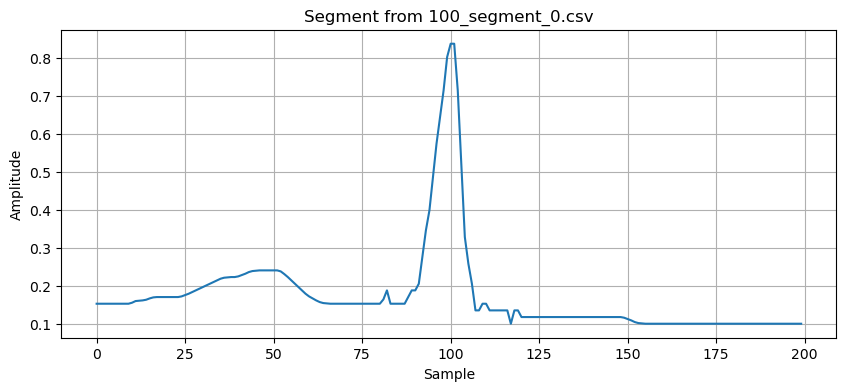

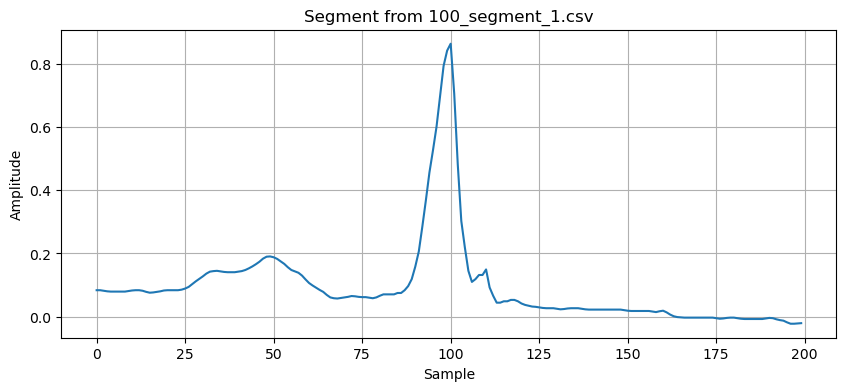

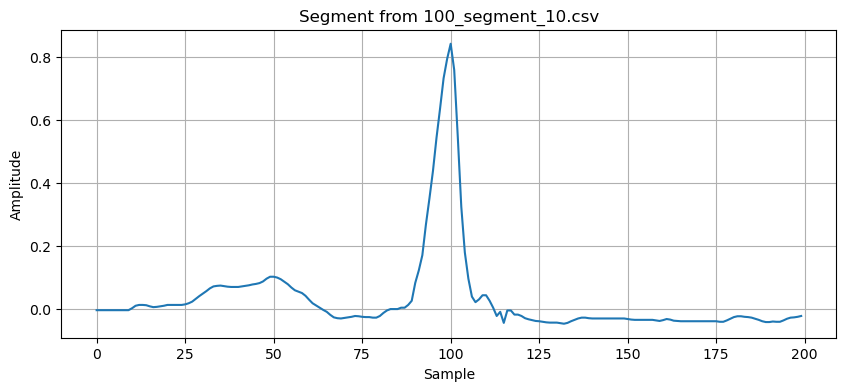

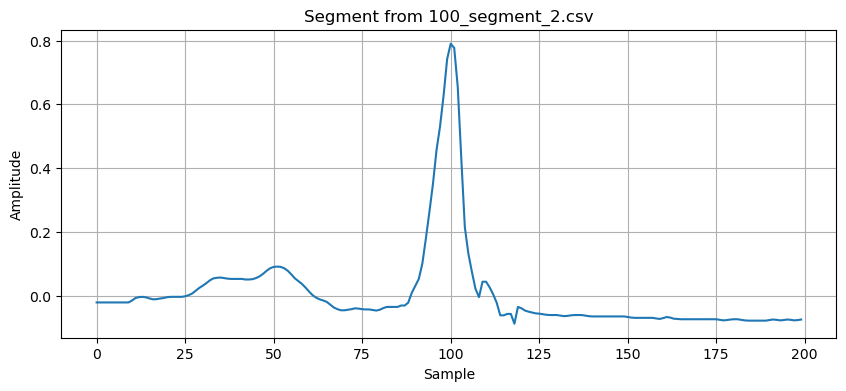

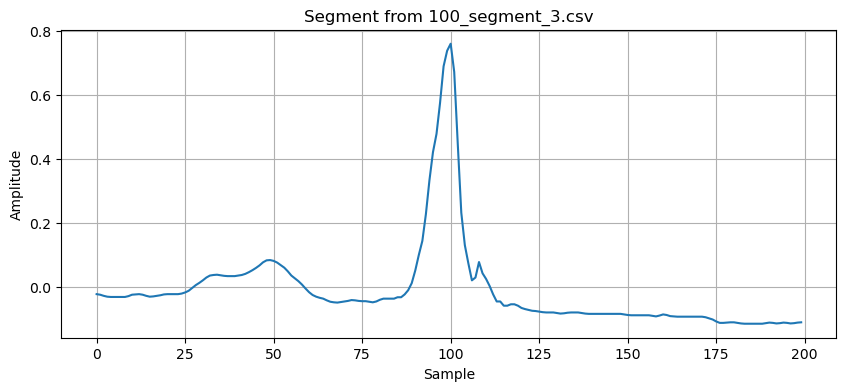

...

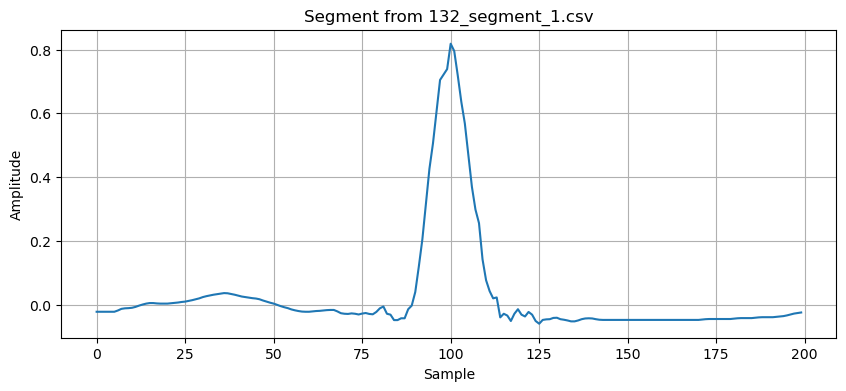

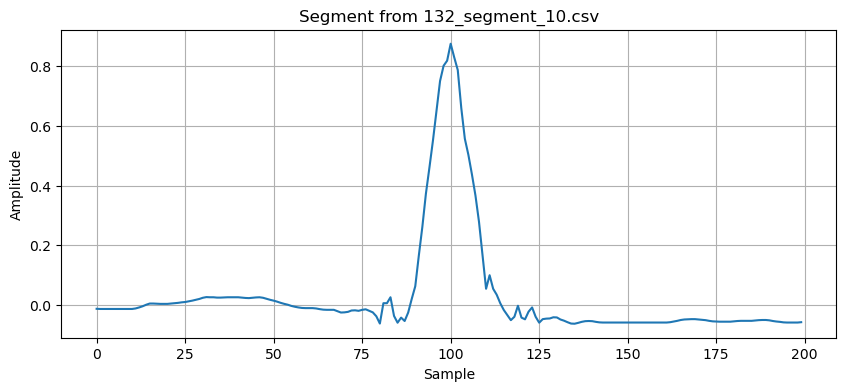

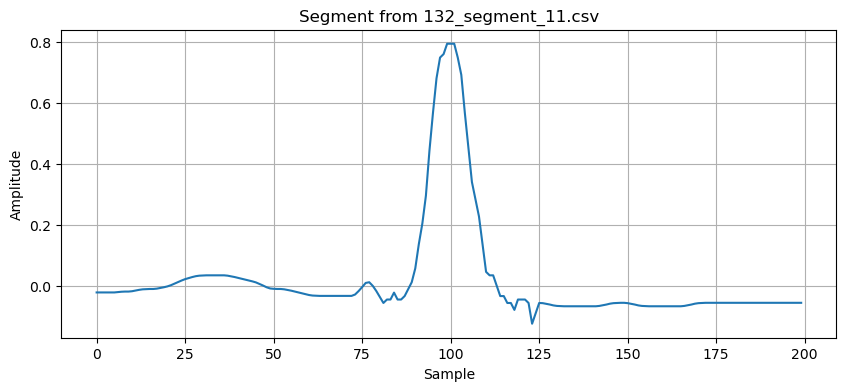

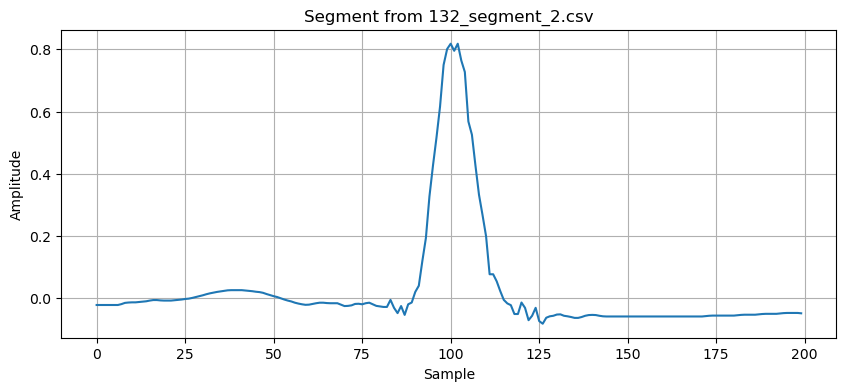

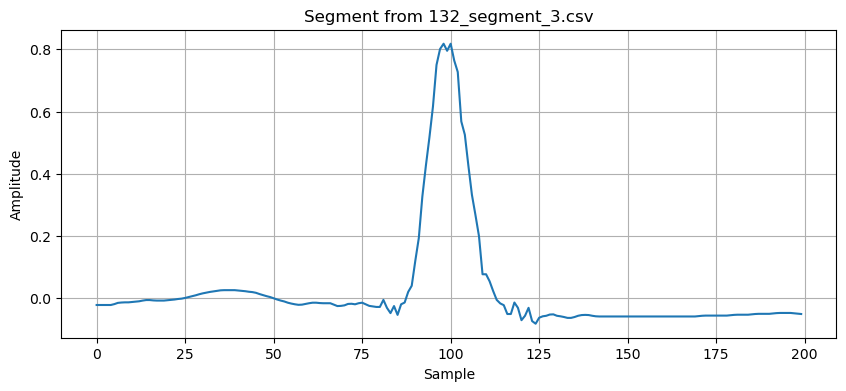

KeyboardInterrupt: 

In [20]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Path to the folder containing segmented data
segmented_folder = 'data_segmented'

# Get a list of CSV files in the segmented folder, sorted alphabetically
files = sorted([file for file in os.listdir(segmented_folder) if file.endswith(".csv")])

# Iterate through each CSV file in sorted order
for file in files:
    file_path = os.path.join(segmented_folder, file)
    
    # Load the segment data from the CSV file
    segment = np.loadtxt(file_path, delimiter=',')
    
    # Plot the segment
    plt.figure(figsize=(10, 4))
    plt.plot(segment)
    plt.title(f'Segment from {file}')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


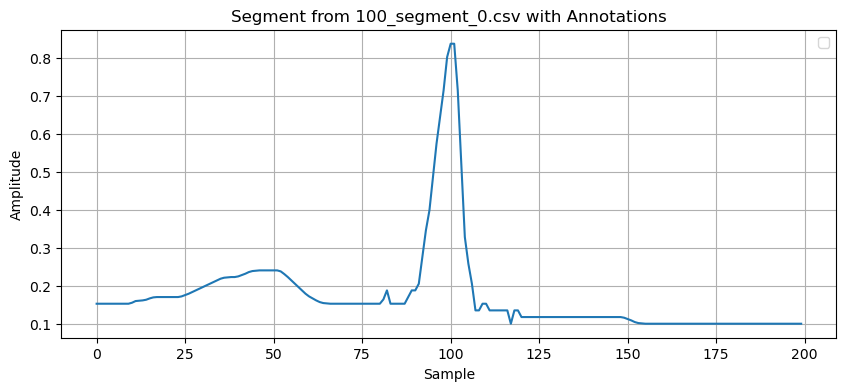

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


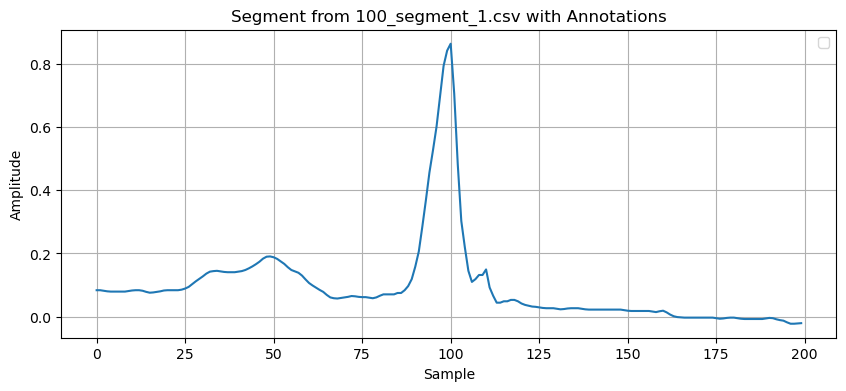

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


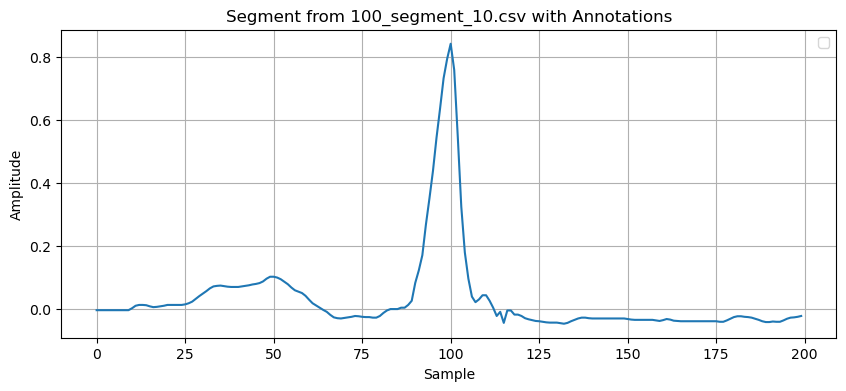

ValueError: cannot reshape array of size 5141 into shape (2)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Path to the folder containing segmented data
segmented_folder = 'data_segmented'

# Get a list of CSV files in the segmented folder, sorted alphabetically
files = sorted([file for file in os.listdir(segmented_folder) if file.endswith(".csv")])

# Iterate through each CSV file in sorted order
for file in files:
    file_path = os.path.join(segmented_folder, file)
    
    # Load the segment data from the CSV file
    segment = np.loadtxt(file_path, delimiter=',')
    
    # Load the corresponding annotation file
    annotation_path = os.path.join(segmented_folder, file).replace('.csv', '')
    annotation = wfdb.rdann(annotation_path, extension='csv')
    
    # Plot the segment with annotations
    plt.figure(figsize=(10, 4))
    plt.plot(segment)
    
    # Plot annotation points
    for label, index in zip(annotation.symbol, annotation.sample):
        if label in ['p', 'P', 'N', 't', 'T']:
            plt.plot(index - annotation.sample[0], segment[index - annotation.sample[0]], 'ro', label=label)
    
    plt.title(f'Segment from {file} with Annotations')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()


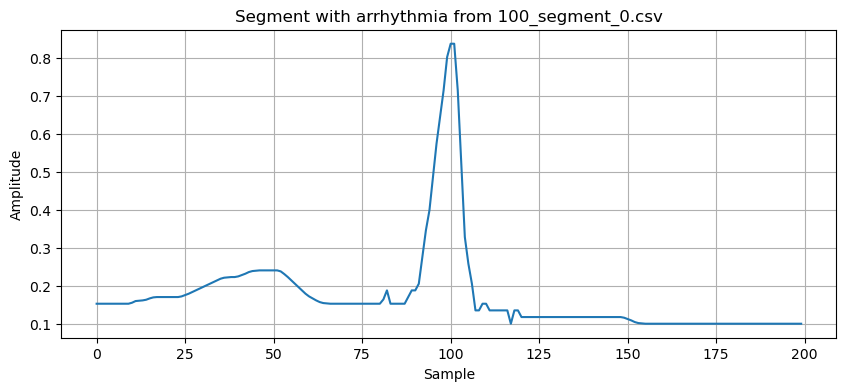

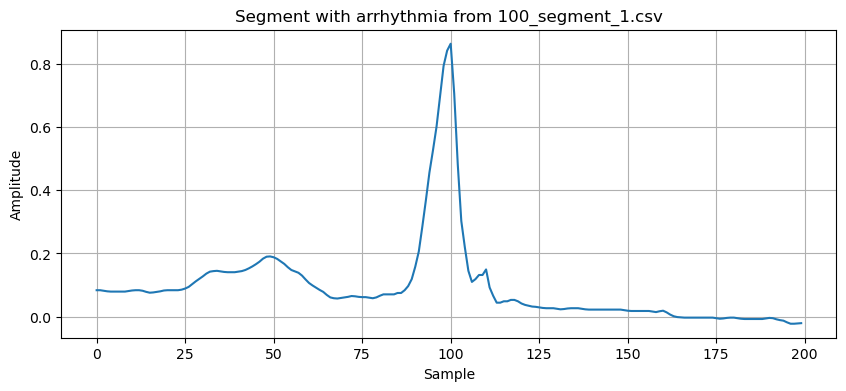

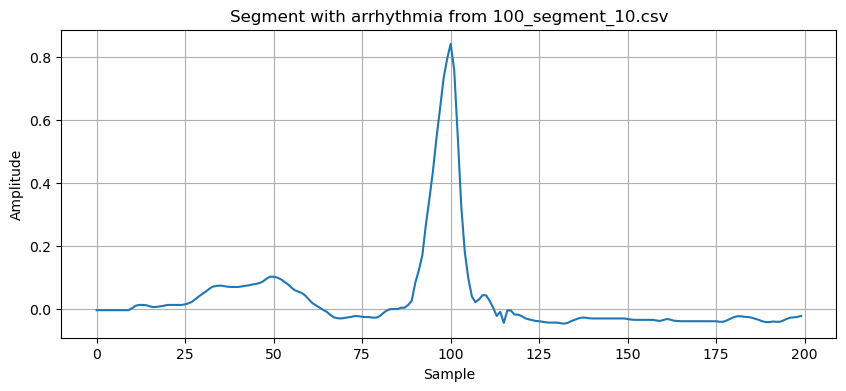

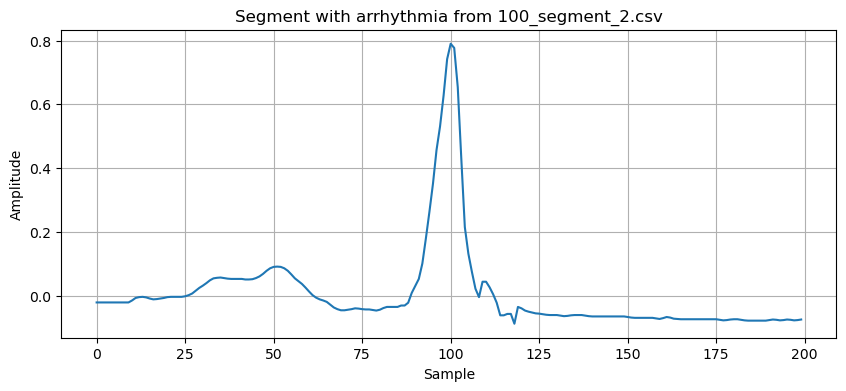

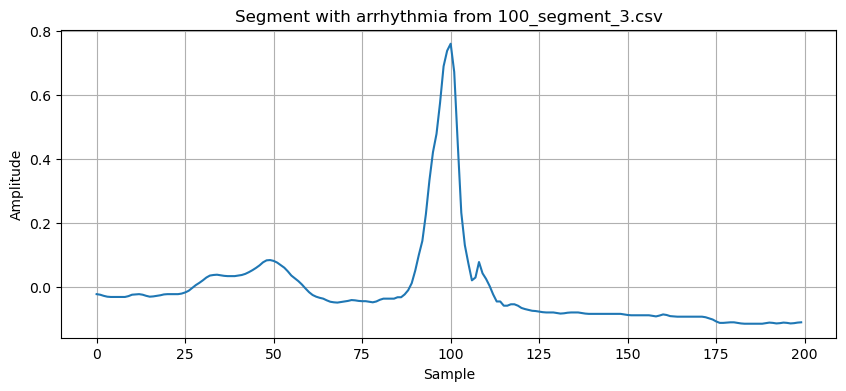

...

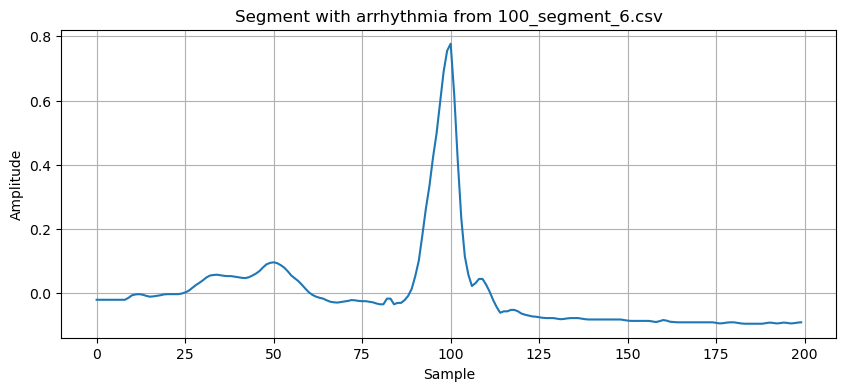

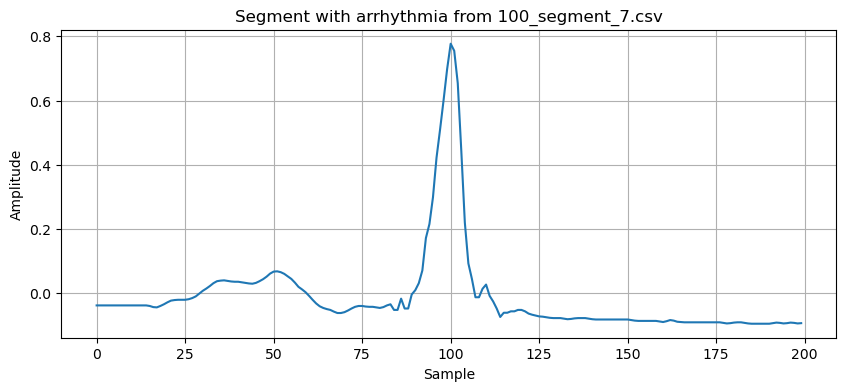

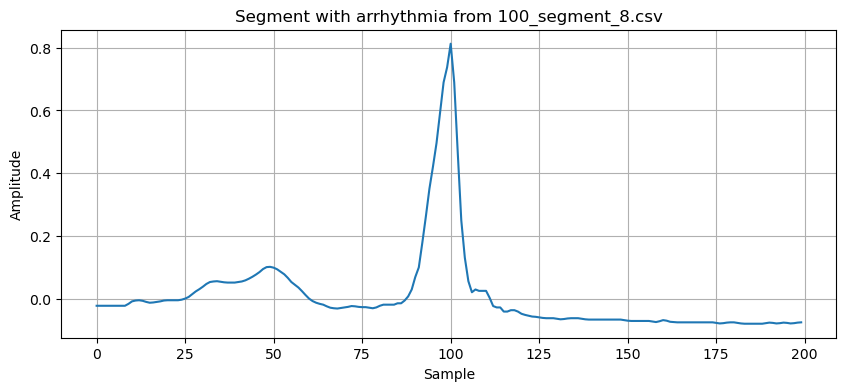

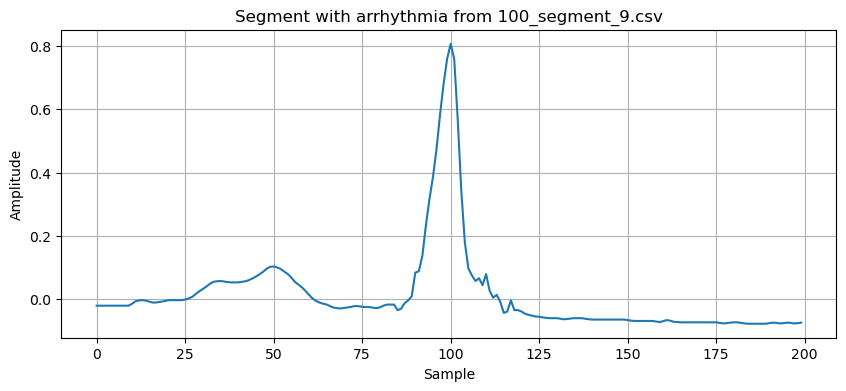

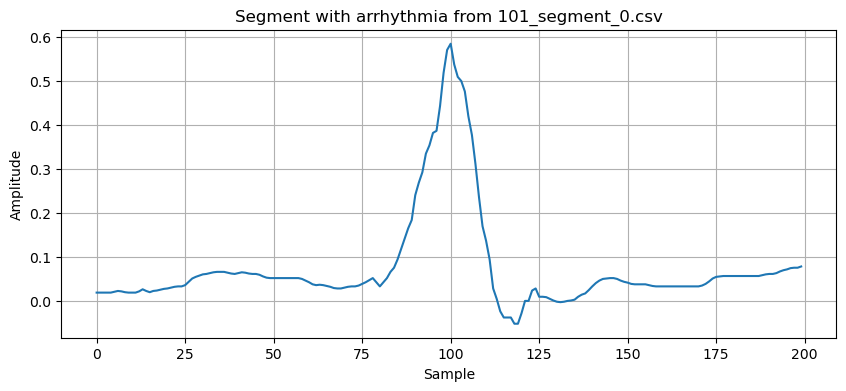

KeyboardInterrupt: 

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Path to the folder containing segmented data
segmented_folder = 'data_segmented'

# Get a list of CSV files in the segmented folder, sorted alphabetically
files = sorted([file for file in os.listdir(segmented_folder) if file.endswith(".csv")])

# Define the criteria for identifying arrhythmia
deviation_threshold = 0.2  # Adjust as needed

# Iterate through each CSV file and plot segments with arrhythmia
for file in files:
    file_path = os.path.join(segmented_folder, file)
    segment = np.loadtxt(file_path, delimiter=',')
    
    # Check for arrhythmia in the segment
    deviation = np.abs(segment - np.mean(segment))
    if np.max(deviation) > deviation_threshold:
        plt.figure(figsize=(10, 4))
        plt.plot(segment)
        plt.title(f'Segment with arrhythmia from {file}')
        plt.xlabel('Sample')
        plt.ylabel('Amplitude')
        plt.grid(True)
        plt.show()


# Dados do DF

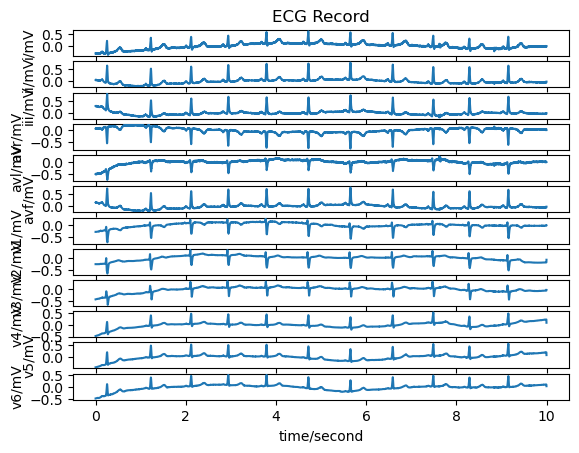

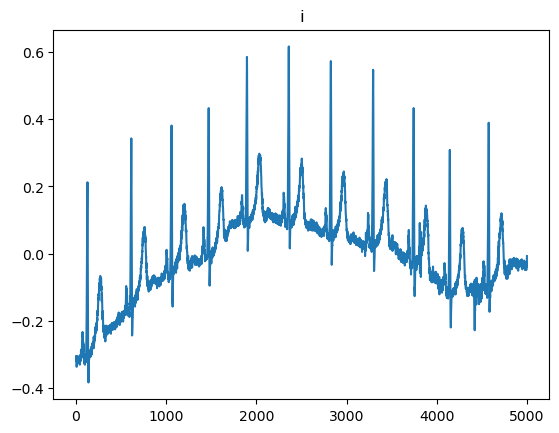

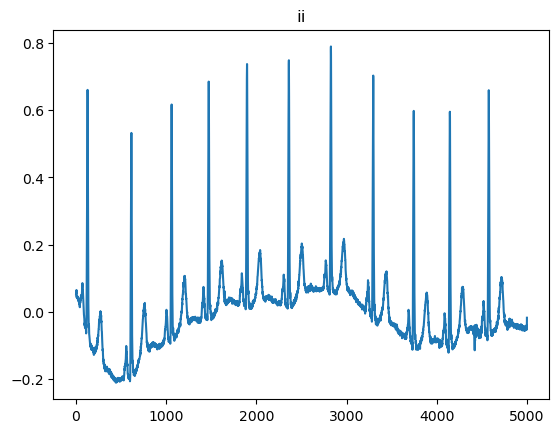

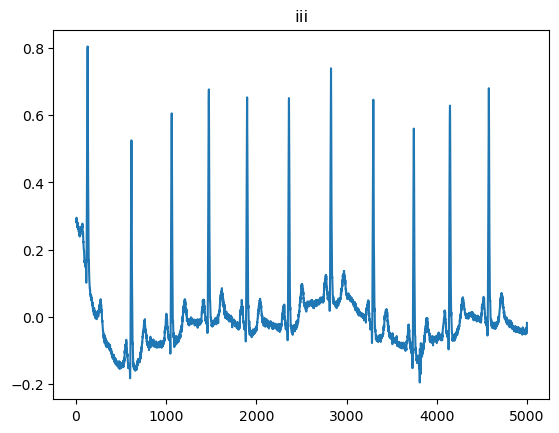

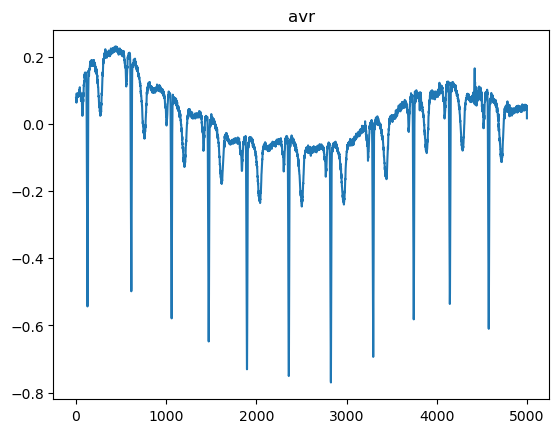

...

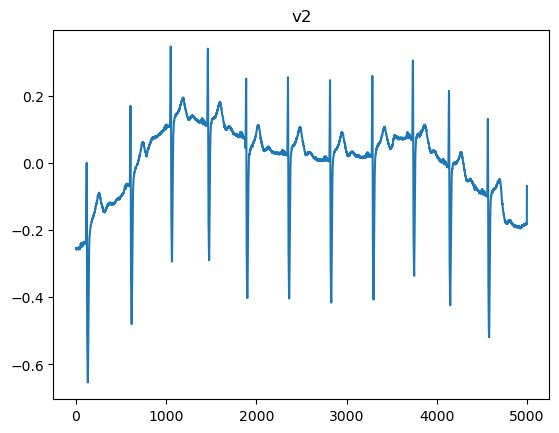

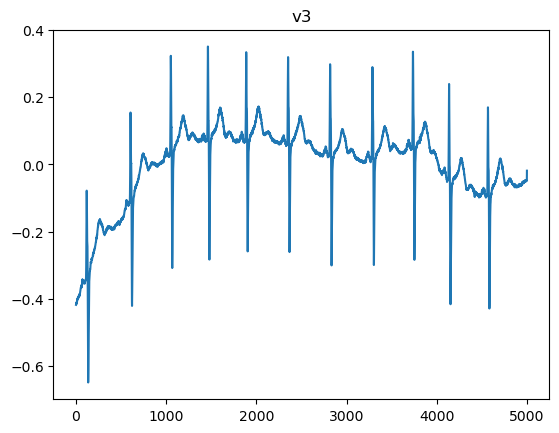

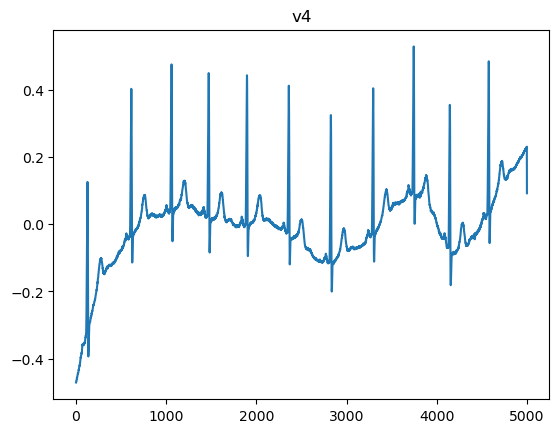

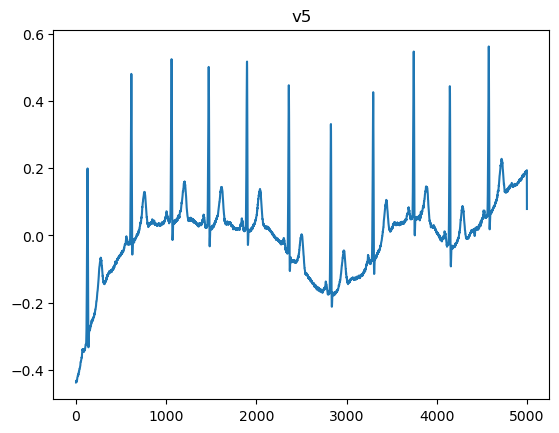

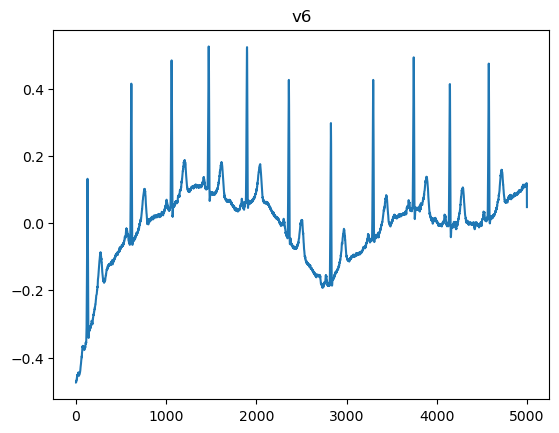

In [ ]:
import wfdb
import matplotlib.pyplot as plt

# Replace '5' with the base file name of your ECG data for patient 5
record = wfdb.rdrecord('data/195')

# Plot all leads
wfdb.plot_wfdb(record=record, title='ECG Record')

# Extract individual leads and plot them
for sig_name in record.sig_name:
    sig, fields = wfdb.rdsamp('data/195', channels=[record.sig_name.index(sig_name)])
    plt.figure()
    plt.plot(sig)
    plt.title(sig_name)

# Read annotations for each lead and plot them
for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
    try:
        annotation = wfdb.rdann('data_5/5', extension=lead_extension[1:])  # Remove the dot from the extension
        p_wave_inds = [i for i, a in enumerate(annotation.symbol) if a in ['p', 'P']]  # P wave annotations
        qrs_inds = [i for i, a in enumerate(annotation.symbol) if a == 'N']  # QRS complex annotations
        t_wave_inds = [i for i, a in enumerate(annotation.symbol) if a in ['t', 'T']]  # T wave annotations
        
        plt.figure()
        plt.plot(annotation.sample[p_wave_inds], sig[annotation.sample[p_wave_inds]], 'ro', label='P wave', markersize=5)
        plt.plot(annotation.sample[qrs_inds], sig[annotation.sample[qrs_inds]], 'g+', label='QRS complex', markersize=5)
        plt.plot(annotation.sample[t_wave_inds], sig[annotation.sample[t_wave_inds]], 'bx', label='T wave', markersize=5)
        plt.title(f'{lead_extension[1:]} Annotations')
        plt.legend()
    except:
        pass

plt.show()

In [ ]:
import wfdb

# Replace '5' with the base file name of your ECG data for patient 5
record = wfdb.rdrecord('data/5')

# Read annotations for each lead and print them
for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
    try:
        annotation = wfdb.rdann('data/5', extension=lead_extension[1:])  # Remove the dot from the extension
        print(f'Lead {lead_extension[1:]} Annotations:')
        for sample, symbol in zip(annotation.sample, annotation.symbol):
            if symbol not in ['(', ')', 'P', 't', 'p']:
                print(f'Sample: {sample}, Symbol: {symbol}')
    except:
        pass

Lead i Annotations:
Sample: 999, Symbol: N
Sample: 1510, Symbol: N
Sample: 2023, Symbol: N
Sample: 2549, Symbol: N
Sample: 3078, Symbol: N
Sample: 3578, Symbol: N
Sample: 4084, Symbol: N
Lead ii Annotations:
Sample: 999, Symbol: N
Sample: 1510, Symbol: N
Sample: 2024, Symbol: N
Sample: 2549, Symbol: N
Sample: 3078, Symbol: N
Sample: 3578, Symbol: N
Sample: 4084, Symbol: N
Lead iii Annotations:
Sample: 1000, Symbol: N
Sample: 1511, Symbol: N
Sample: 2025, Symbol: N
Sample: 2550, Symbol: N
Sample: 3079, Symbol: N
Sample: 3579, Symbol: N
Sample: 4086, Symbol: N
Lead avr Annotations:
Sample: 1009, Symbol: N
Sample: 1519, Symbol: N
Sample: 2035, Symbol: N
Sample: 2562, Symbol: N
Sample: 3088, Symbol: N
Sample: 3590, Symbol: N
Sample: 4094, Symbol: N
Lead avl Annotations:
Sample: 998, Symbol: N
Sample: 1510, Symbol: N
Sample: 2027, Symbol: N
Sample: 2547, Symbol: N
Sample: 3077, Symbol: N
Sample: 3578, Symbol: N
Sample: 4085, Symbol: N
Lead avf Annotations:
Sample: 999, Symbol: N
Sample: 151

In [ ]:
import wfdb

# Replace '5' with the base file name of your ECG data for patient 5
record = wfdb.rdrecord('data/197')

# Read annotations for each lead and print them
for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
    try:
        annotation = wfdb.rdann('data/197', extension=lead_extension[1:])  # Remove the dot from the extension
        print(f'Lead {lead_extension[1:]} Annotations:')
        for sample, symbol in zip(annotation.sample, annotation.symbol):
            if symbol not in ['(', ')', 'P', 't', 'p', 'N']:
                print(f'Sample: {sample}, Symbol: {symbol}')
    except:
        pass

Lead i Annotations:
Lead ii Annotations:
Lead iii Annotations:
Lead avr Annotations:
Lead avl Annotations:
Lead avf Annotations:
Lead v1 Annotations:
Lead v2 Annotations:
Lead v3 Annotations:
Lead v4 Annotations:
Lead v5 Annotations:
Lead v6 Annotations:


In [28]:
import wfdb

# Replace '5' with the base file name of your ECG data for patient 5
rec = 22
record = wfdb.rdrecord(f'data/23')

# Read annotations for each lead and print them
for lead_extension in ['.i', '.ii', '.iii', '.avr', '.avl', '.avf', '.v1', '.v2', '.v3', '.v4', '.v5', '.v6']:
    try:
        annotation = wfdb.rdann(f'data/{rec}', extension=lead_extension[1:])  # Remove the dot from the extension
        print(f'Lead {lead_extension[1:]} Annotations:')
        for sample, symbol in zip(annotation.sample, annotation.symbol):
            if symbol not in ['(', ')', 'P', 't', 'p']:
                print(f'Sample: {sample}, Symbol: {symbol}')
    except:
        pass

Lead i Annotations:
Sample: 446, Symbol: N
Sample: 840, Symbol: N
Sample: 1237, Symbol: N
Sample: 1574, Symbol: N
Sample: 2009, Symbol: N
Sample: 2368, Symbol: N
Sample: 2774, Symbol: N
Sample: 3164, Symbol: N
Sample: 3582, Symbol: N
Sample: 3952, Symbol: N
Sample: 4370, Symbol: N
Lead ii Annotations:
Sample: 452, Symbol: N
Sample: 845, Symbol: N
Sample: 1242, Symbol: N
Sample: 1579, Symbol: N
Sample: 2014, Symbol: N
Sample: 2374, Symbol: N
Sample: 2780, Symbol: N
Sample: 3169, Symbol: N
Sample: 3587, Symbol: N
Sample: 3957, Symbol: N
Sample: 4374, Symbol: N
Lead iii Annotations:
Sample: 454, Symbol: N
Sample: 848, Symbol: N
Sample: 1244, Symbol: N
Sample: 1581, Symbol: N
Sample: 2019, Symbol: N
Sample: 2378, Symbol: N
Sample: 2783, Symbol: N
Sample: 3172, Symbol: N
Sample: 3589, Symbol: N
Sample: 3962, Symbol: N
Sample: 4379, Symbol: N
Lead avr Annotations:
Sample: 462, Symbol: N
Sample: 856, Symbol: N
Sample: 1255, Symbol: N
Sample: 1590, Symbol: N
Sample: 2026, Symbol: N
Sample: 238

In [ ]:
df

,ID,Sex,Age,Rhythms,Electric axis of the heart,Conduction abnormalities,Extrasystolies,Hypertrophies,Cardiac pacing,Ischemia,Non-specific repolarization abnormalities,Other states
0,1,F\n,51\n,Sinus bradycardia,Electric axis of the heart: left axis deviation,NaN,NaN,Left ventricular overload\nLeft ventricular hy...,NaN,NaN,Non-specific repolarization abnormalities: pos...,NaN
1,2,M\n,64\n,Sinus rhythm,Electric axis of the heart: normal,NaN,NaN,Left atrial hypertrophy\nLeft ventricular hype...,NaN,NaN,Non-specific repolarization abnormalities: pos...,NaN
2,3,M\n,53\n,Sinus rhythm,Electric axis of the heart: vertical,NaN,NaN,Left atrial hypertrophy\nLeft ventricular hype...,NaN,Ischemia: inferior wall\nIschemia: lateral wall,NaN,NaN
3,4,M\n,56\n,Sinus rhythm,Electric axis of the heart: left axis deviation,Incomplete right bundle branch block,NaN,Left atrial hypertrophy\nLeft ventricular hype...,NaN,Ischemia: inferior wall\nScar formation: infer...,NaN,NaN
4,5,M\n,61\n,Sinus rhythm,Electric axis of the heart: horizontal,NaN,NaN,Left atrial hypertrophy,NaN,NaN,Non-specific repolarization abnormalities: inf...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
195,196,F\n,63\n,Sinus rhythm,Electric axis of the heart: horizontal,NaN,NaN,Left atrial hypertrophy\nLeft ventricular hype...,NaN,NaN,Non-specific repolarization abnormalities: ant...,NaN
196,197,F\n,34\n,Sinus arrhythmia,Electric axis of the heart: normal,NaN,NaN,Right atrial overload,NaN,NaN,NaN,NaN
197,198,F\n,38\n,Sinus rhythm,Electric axis of the heart: normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198,199,F\n,34\n,Sinus rhythm,Electric axis of the heart: normal,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df['Other states'].value_counts()

Other states
Early repolarization syndrome    9
Name: count, dtype: int64